**❤❤❤❤❤❤❤❤❤❤❤❤❤❤ welcome ❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤❤** 

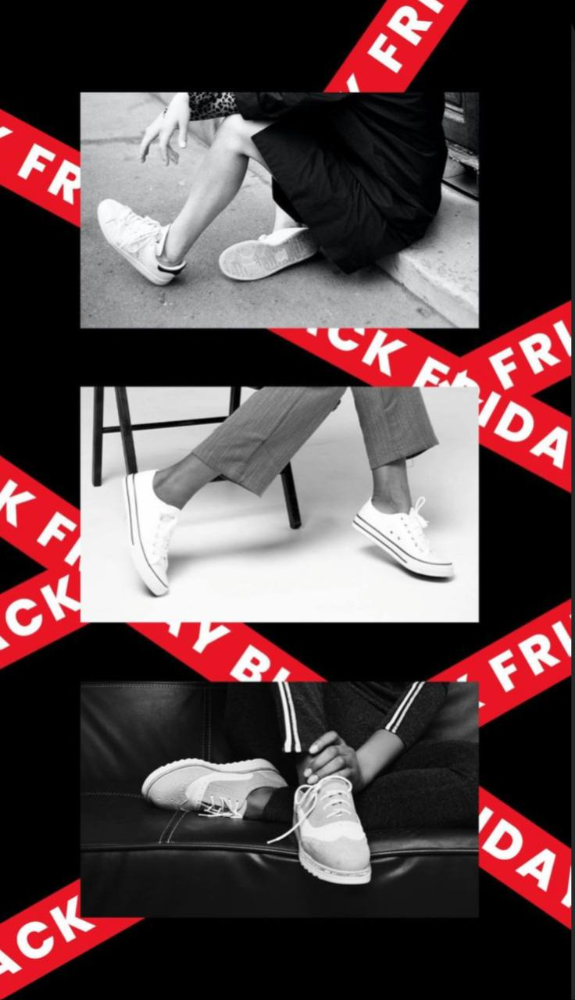



**Black Friday Sales Prediction**

*This dataset comprises of sales transactions captured at a retail store. It’s a classic dataset to explore and expand your feature engineering skills and day to day understanding from multiple shopping experiences. This is a regression problem. The dataset has 550,069 rows and 12 columns.

Problem: Predict purchase amount.



Problem Statement

A retail company wants to understand the customer purchase behaviour (specifically, purchase amount) against various products of different categories. They have shared purchase summary of various customers for selected high volume products from last month. The data set also contains customer demographics (age, gender, marital status, city_type, stay_in_current_city), product details (product_id and product category) and Total purchase_amount from last month.

Now, they want to build a model to predict the purchase amount of customer against various products which will help them to create personalized offer for customers against different products.


**Data Overview**

Dataset has 537577 rows (transactions) and 12 columns (features) as described below:



*  User_ID: Unique ID of the user. There are a total of 5891 users in the dataset.
*   Product_ID: Unique ID of the product. There are a total of 3623 products in the dataset.


*   Gender: indicates the gender of the person making the transaction.
*   Age: indicates the age group of the person making the transaction.

*  Occupation: shows the occupation of the user, already labeled with numbers 0 to 20.m
*   City_Category: User's living city category. Cities are categorized into 3 different categories 'A', 'B' and 'C'.


*   Stay_In_Current_City_Years: Indicates how long the users has lived in this city.
*   Marital_Status: is 0 if the user is not married and 1 otherwise.


*  Product_Category_1 to _3: Category of the product. All 3 are already labaled with numbers
*  Purchase: Purchase amount.











# **import library**

In [ ]:
# manipulation data
import pandas as pd
import numpy as np

#visualiation data
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot

#default theme
plt.style.use('ggplot')
sns.set(context='notebook', style='darkgrid', palette='colorblind', font='sans-serif', font_scale=1, rc=None)
matplotlib.rcParams['figure.figsize'] =[8,8]
matplotlib.rcParams.update({'font.size': 15})
matplotlib.rcParams['font.family'] = 'sans-serif'

import warnings
warnings.filterwarnings("ignore")


# **data analysis** 

In [ ]:
df = pd.read_csv("/content/black friday.csv.txt")
df

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Product_Category_3,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,NaN,NaN,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,6.0,14.0,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,NaN,NaN,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,14.0,NaN,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,NaN,NaN,7969
...,...,...,...,...,...,...,...,...,...,...,...,...
550063,1006033,P00372445,M,51-55,13,B,1,1,20,NaN,NaN,368
550064,1006035,P00375436,F,26-35,1,C,3,0,20,NaN,NaN,371
550065,1006036,P00375436,F,26-35,15,B,4+,1,20,NaN,NaN,137
550066,1006038,P00375436,F,55+,1,C,2,0,20,NaN,NaN,365


In [ ]:
df.shape


(550068, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 12 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   User_ID                     550068 non-null  int64  
 1   Product_ID                  550068 non-null  object 
 2   Gender                      550068 non-null  object 
 3   Age                         550068 non-null  object 
 4   Occupation                  550068 non-null  int64  
 5   City_Category               550068 non-null  object 
 6   Stay_In_Current_City_Years  550068 non-null  object 
 7   Marital_Status              550068 non-null  int64  
 8   Product_Category_1          550068 non-null  int64  
 9   Product_Category_2          376430 non-null  float64
 10  Product_Category_3          166821 non-null  float64
 11  Purchase                    550068 non-null  int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 50.4+ MB


***Age*** should be treated as a numerical column

**City_Category** we can convert this to a numerical column and should look at the frequency of each city category.

**Gender** has two values and should be converted to binary values

**Product_Category_2** and Product_Category_3 have null values

type of data


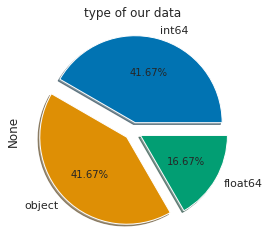

In [ ]:
df.dtypes.value_counts().plot.pie(explode=[0.1,0.1,0.1],autopct='%1.2f%%',shadow=True)
plt.title('type of our data');

**Checking Null values** 

In [ ]:
df.isna().sum()

User_ID                            0
Product_ID                         0
Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Product_Category_3            383247
Purchase                           0
dtype: int64

 percentage in null values

In [ ]:
df.isnull().sum()/df.shape[0]*100


User_ID                        0.000000
Product_ID                     0.000000
Gender                         0.000000
Age                            0.000000
Occupation                     0.000000
City_Category                  0.000000
Stay_In_Current_City_Years     0.000000
Marital_Status                 0.000000
Product_Category_1             0.000000
Product_Category_2            31.566643
Product_Category_3            69.672659
Purchase                       0.000000
dtype: float64

There are 31% null values in the **Product_Category_2** and 69% null values in the **Product_Category_3**

Only **Product_Category_2** and **Product_Category_3** have null values which is good . However Product_Category_3 is null for nearly 70% of transactions so it can't give us much information. so we gonna drop **Product_Category_3**

In [ ]:
df.drop(columns=['Product_Category_3'],axis=1,inplace=True)


**Unique elements in each attributes**

In [ ]:
df.nunique()


User_ID                        5891
Product_ID                     3631
Gender                            2
Age                               7
Occupation                       21
City_Category                     3
Stay_In_Current_City_Years        5
Marital_Status                    2
Product_Category_1               20
Product_Category_2               17
Purchase                      18105
dtype: int64

 also we can drop  **User_ID** and **Product_ID** for model prediction as it has more unique values and will not be use



In [ ]:
df.drop(columns=['User_ID','Product_ID'],axis=1,inplace=True)
df.head()

,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Purchase
0,F,0-17,10,A,2,0,3,NaN,8370
1,F,0-17,10,A,2,0,1,6.0,15200
2,F,0-17,10,A,2,0,12,NaN,1422
3,F,0-17,10,A,2,0,12,14.0,1057
4,M,55+,16,C,4+,0,8,NaN,7969


show the numirical values

In [ ]:
num_columns = [f for f in df.columns if df.dtypes[f] != 'object']
num_columns.remove('Purchase')
num_columns

['Occupation', 'Marital_Status', 'Product_Category_1', 'Product_Category_2']

show the categorical values

In [ ]:

cat_columns = [f for f in df.columns if df.dtypes[f] == 'object']
cat_columns

['Gender', 'Age', 'City_Category', 'Stay_In_Current_City_Years']

describing data

In [ ]:
df.describe(include='all')


,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Purchase
count,550068,550068,550068.000000,550068,550068,550068.000000,550068.000000,376430.000000,550068.000000
unique,2,7,NaN,3,5,NaN,NaN,NaN,NaN
top,M,26-35,NaN,B,1,NaN,NaN,NaN,NaN
freq,414259,219587,NaN,231173,193821,NaN,NaN,NaN,NaN
mean,NaN,NaN,8.076707,NaN,NaN,0.409653,5.404270,9.842329,9263.968713
std,NaN,NaN,6.522660,NaN,NaN,0.491770,3.936211,5.086590,5023.065394
min,NaN,NaN,0.000000,NaN,NaN,0.000000,1.000000,2.000000,12.000000
25%,NaN,NaN,2.000000,NaN,NaN,0.000000,1.000000,5.000000,5823.000000
50%,NaN,NaN,7.000000,NaN,NaN,0.000000,5.000000,9.000000,8047.000000
75%,NaN,NaN,14.000000,NaN,NaN,1.000000,8.000000,15.000000,12054.000000




*   Most of the transactions were made by men.

*   Age group with most transactions was 26-35.

*   City Category with most transactions was B



## **deal with missing values**

In [ ]:
df.isna().sum()

Gender                             0
Age                                0
Occupation                         0
City_Category                      0
Stay_In_Current_City_Years         0
Marital_Status                     0
Product_Category_1                 0
Product_Category_2            173638
Purchase                           0
dtype: int64

In [ ]:
#from sklearn.impute import SimpleImputer, KNNImputer


In [ ]:
#imputer= SimpleImputer(strategy="mean")
#df['Product_Category_2']=imputer.fit_transform(df[['Product_Category_2']])

In [ ]:
df['Product_Category_2'].mode()[0]


8.0

In [ ]:
df['Product_Category_2'].fillna(df['Product_Category_2'].mode()[0], inplace=True)


In [ ]:
df.isna().sum()

Gender                        0
Age                           0
Occupation                    0
City_Category                 0
Stay_In_Current_City_Years    0
Marital_Status                0
Product_Category_1            0
Product_Category_2            0
Purchase                      0
dtype: int64

# *EDA*

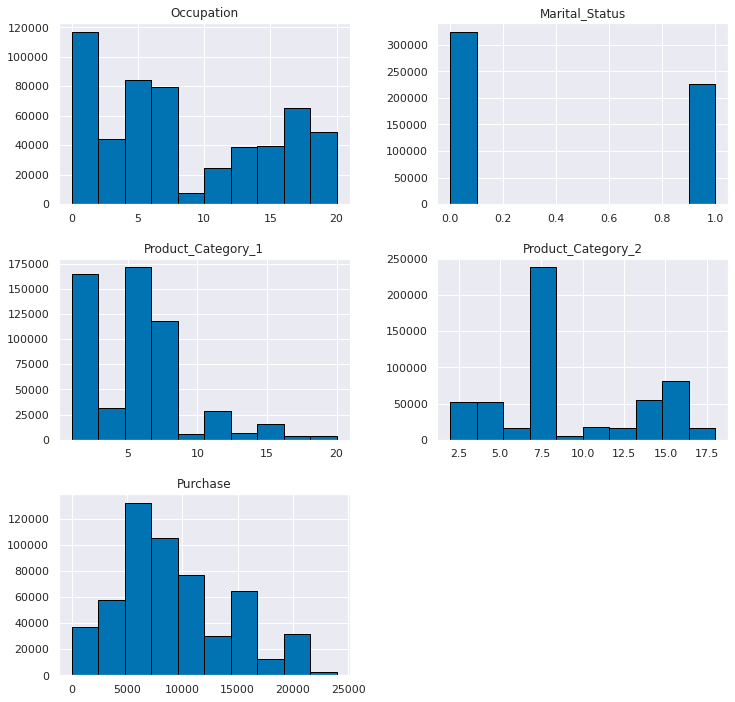

In [ ]:
df.hist(edgecolor='black',figsize=(12,12));


In [ ]:
px.histogram(data_frame=df, x="Purchase", y='Age',color="Gender")

men are the most peaple paying in black friday between age 26-35

In [ ]:
cat_columns

['Gender', 'Age', 'City_Category', 'Stay_In_Current_City_Years']

catigorical features

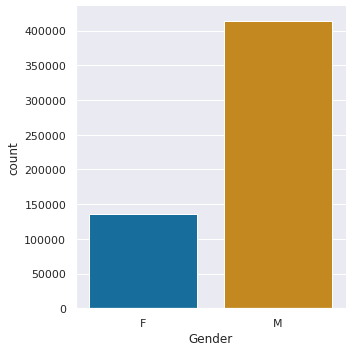

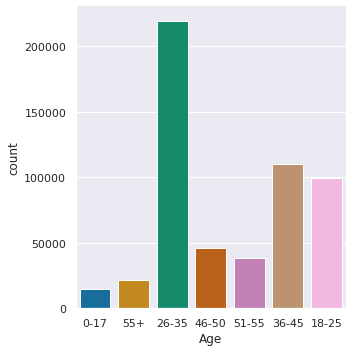

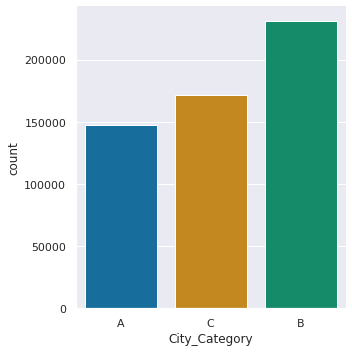

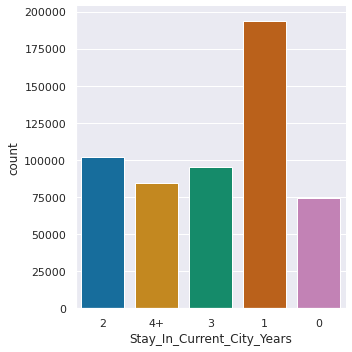

In [ ]:
for i in cat_columns:
  sns.catplot(data=df,x=i,kind='count')


and we know that the num columns have not large number unique values so we can deal with as a cat columns

In [ ]:
num_columns

['Occupation', 'Marital_Status', 'Product_Category_1', 'Product_Category_2']

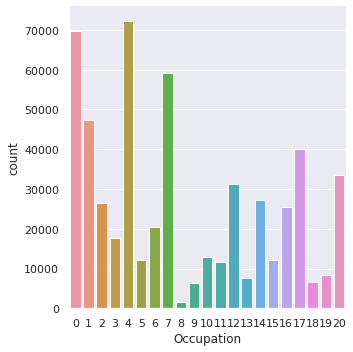

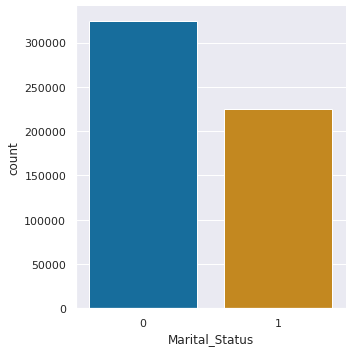

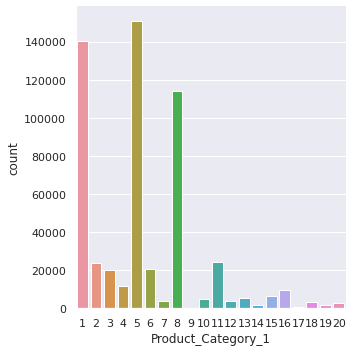

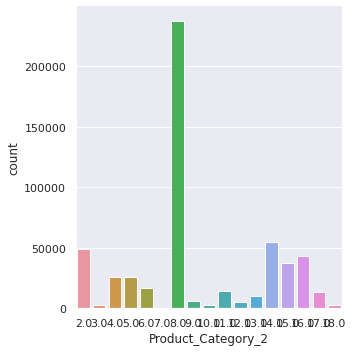

In [ ]:
for i in num_columns:
  sns.catplot(data=df,x=i,kind='count')
  plt.figsize=(12,12)


**Target Variable Purchase**

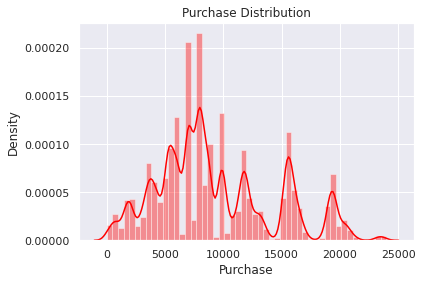

In [ ]:
sns.distplot(df["Purchase"],color='red')
plt.title("Purchase Distribution")
plt.show()

We can observe that purchase amount is repeating for many customers.This may be because on Black Friday many are buying discounted products in large numbers and kind of follows a Gaussian Distribution.




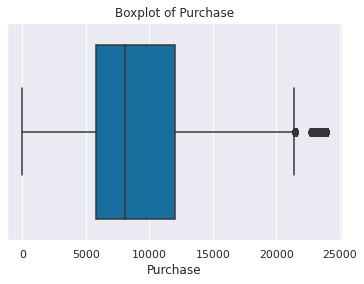

In [ ]:
sns.boxplot(df["Purchase"])
plt.title("Boxplot of Purchase")
plt.show()

In [ ]:
df["Purchase"].skew()


0.6001400037087128

In [ ]:
df["Purchase"].kurtosis()


-0.3383775655851702

In [ ]:
df["Purchase"].describe()


count    550068.000000
mean       9263.968713
std        5023.065394
min          12.000000
25%        5823.000000
50%        8047.000000
75%       12054.000000
max       23961.000000
Name: Purchase, dtype: float64

The purchase is right skewed 



The mu 9263.968712959126 and Sigma 5023.060827959928 for the curve


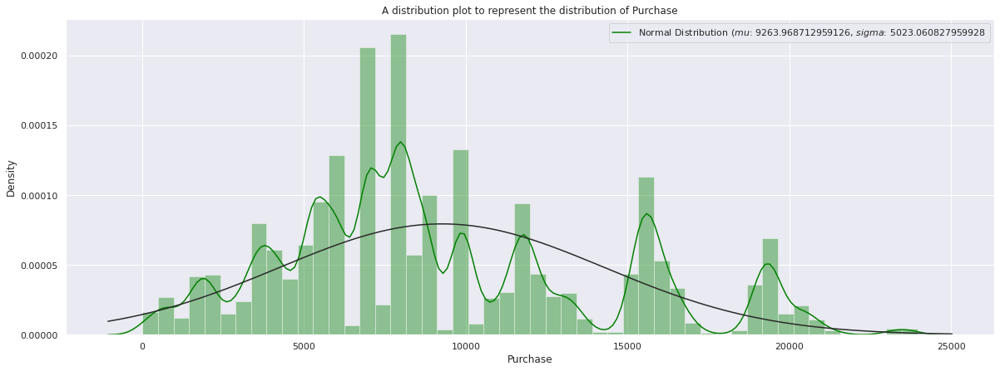

In [ ]:
# importing important libraries
from scipy import stats
from scipy.stats import norm
# plotting a distribution plot for the target variable
plt.rcParams['figure.figsize'] = (20, 7)
sns.distplot(df['Purchase'], color = 'green', fit = norm)

# fitting the target variable to the normal curve 
mu, sigma = norm.fit(df['Purchase']) 
print("The mu {} and Sigma {} for the curve".format(mu, sigma))

plt.title('A distribution plot to represent the distribution of Purchase')
plt.legend(['Normal Distribution ($mu$: {}, $sigma$: {}'.format(mu, sigma)], loc = 'best')
plt.show()

**Gender**

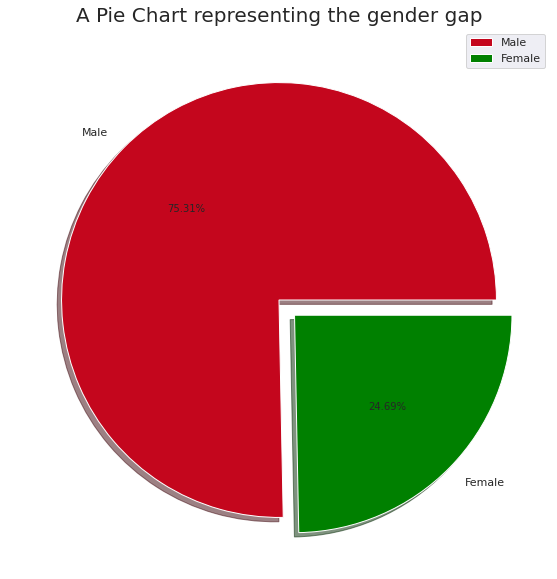

In [ ]:


size = df['Gender'].value_counts()
labels = ['Male', 'Female']
colors = ['#C4061D', 'green']
explode = [0, 0.1]

plt.rcParams['figure.figsize'] = (10, 10)
plt.pie(size, colors = colors, labels = labels, shadow = True, explode = explode, autopct = '%.2f%%')
plt.title('A Pie Chart representing the gender gap', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

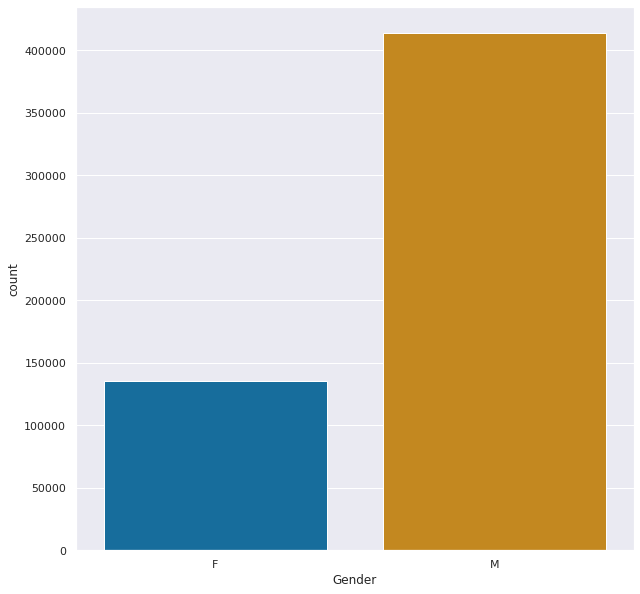

In [ ]:

sns.countplot(df['Gender'])
plt.show()

In [ ]:
df['Gender'].value_counts(normalize=True)*100


M    75.310507
F    24.689493
Name: Gender, dtype: float64

as we said the male is more than female
and that can benefit us in our business 
**we can make more sales and offers for male to earn more in black_friday**

In [ ]:
df.groupby("Gender").mean()["Purchase"]


Gender
F    8734.565765
M    9437.526040
Name: Purchase, dtype: float64

On average the male gender spends more money on purchase contrary to female, and it is possible to also observe this trend by adding the total value of purchase.



**Age**

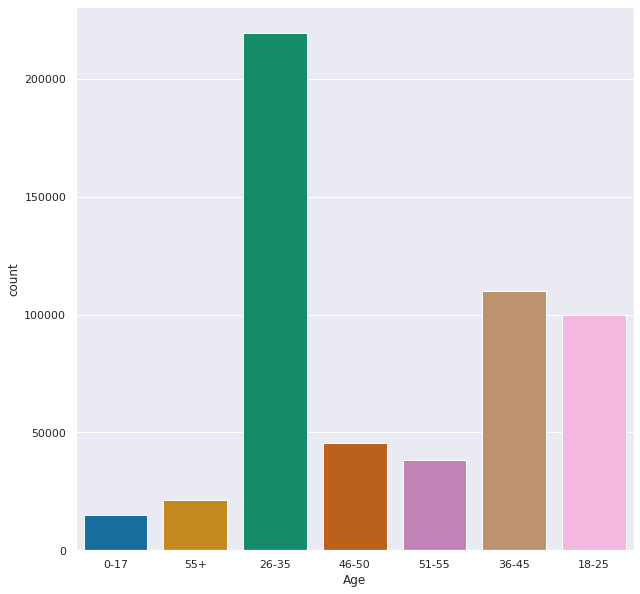

In [ ]:
sns.countplot(x='Age',data=df)

Age 26-35 Age group makes the most no of purchases in the age group.



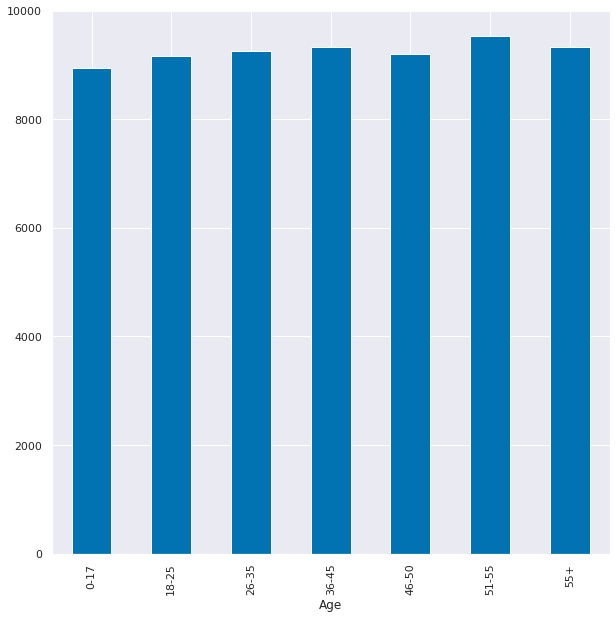

In [ ]:
df.groupby("Age").mean()["Purchase"].plot(kind='bar')


Mean puchase rate between the age groups tends to be the same except that the 51-55 age group has a little higher average purchase amount



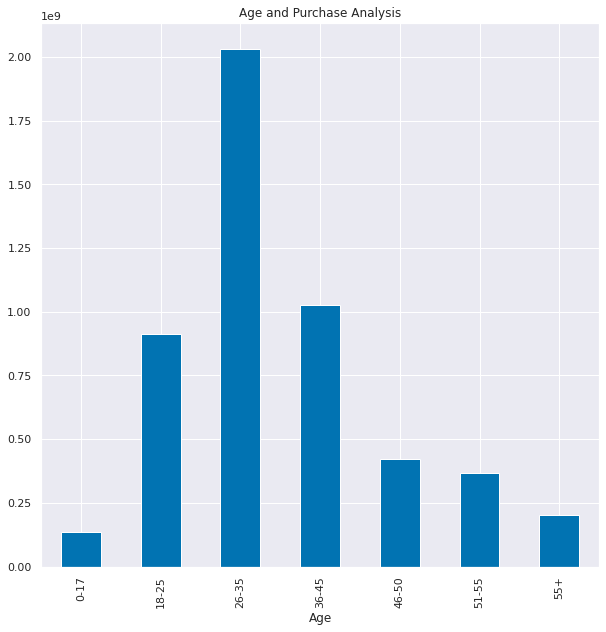

In [ ]:
df.groupby("Age").sum()['Purchase'].plot(kind="bar")
plt.title("Age and Purchase Analysis")
plt.show()


Total amount spent in purchase is in accordance with the number of purchases made, distributed by age.



**Marital Status** 

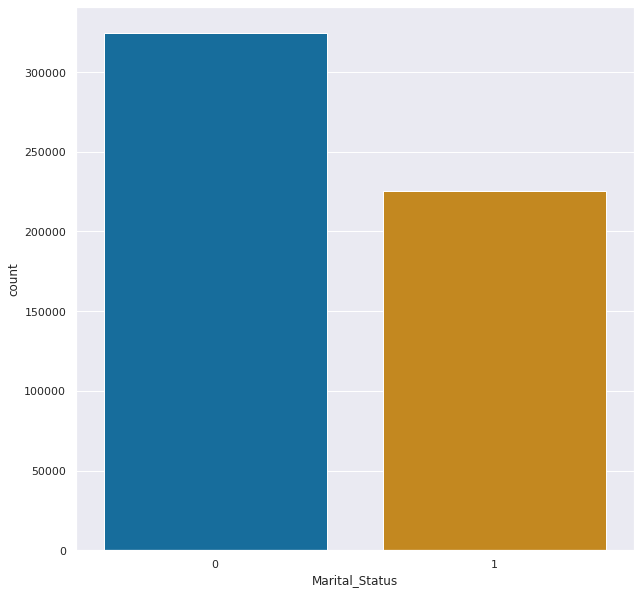

In [ ]:
sns.countplot(df['Marital_Status'])
plt.show()

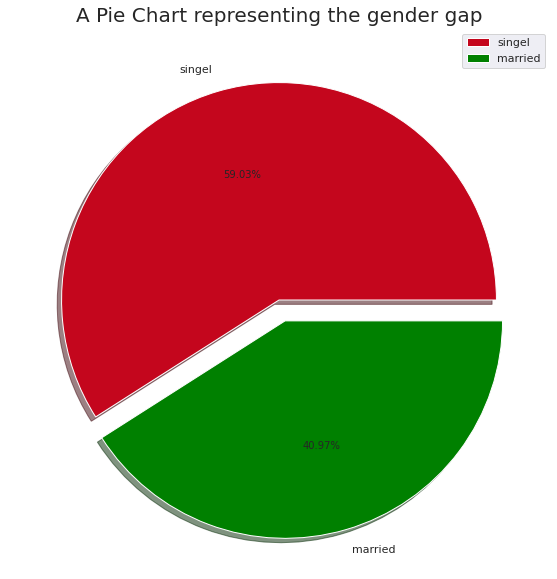

In [ ]:


size = df['Marital_Status'].value_counts()
labels = ['singel', 'married']
colors = ['#C4061D', 'green']
explode = [0, 0.1]

plt.rcParams['figure.figsize'] = (10, 10)
plt.pie(size, colors = colors, labels = labels, shadow = True, explode = explode, autopct = '%.2f%%')
plt.title('A Pie Chart representing the gender gap', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

There are more singel people in the dataset who purchase more



In [ ]:
df.groupby("Marital_Status").mean()["Purchase"]


Marital_Status
0    9265.907619
1    9261.174574
Name: Purchase, dtype: float64

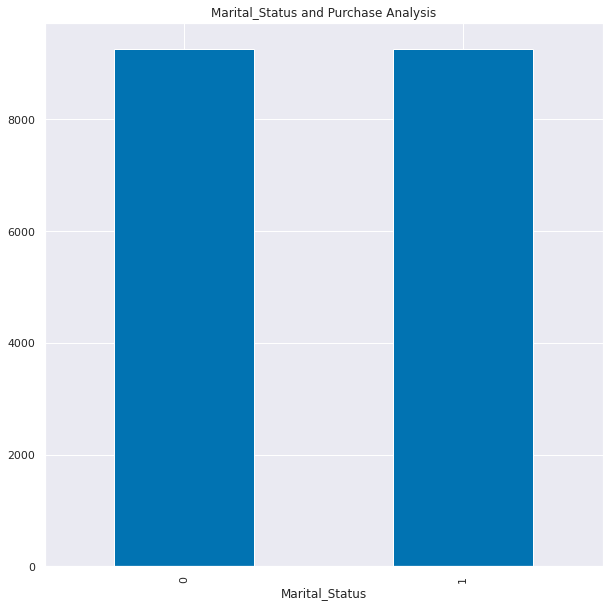

In [ ]:
df.groupby("Marital_Status").mean()["Purchase"].plot(kind='bar')
plt.title("Marital_Status and Purchase Analysis")
plt.show()

This is interesting though unmarried people spend more on purchasing,
**the average purchase amount of married and singel people are the same**


**Occupation**

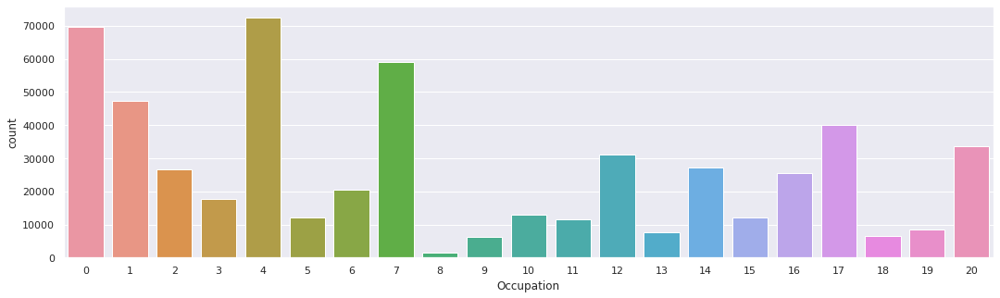

In [ ]:
plt.figure(figsize=(18,5))
sns.countplot(df['Occupation'])
plt.show()

as showen the number of occupation 4 is are most than other 
that can benefit us in black friday by making a new offers to the other occupations to earn more customers 

In [ ]:
occup = pd.DataFrame(df.groupby("Occupation").mean()["Purchase"])
occup

,Purchase
Occupation,
0,9124.428588
1,8953.193270
2,8952.481683
3,9178.593088
4,9213.980251
5,9333.149298
6,9256.535691
7,9425.728223
8,9532.592497


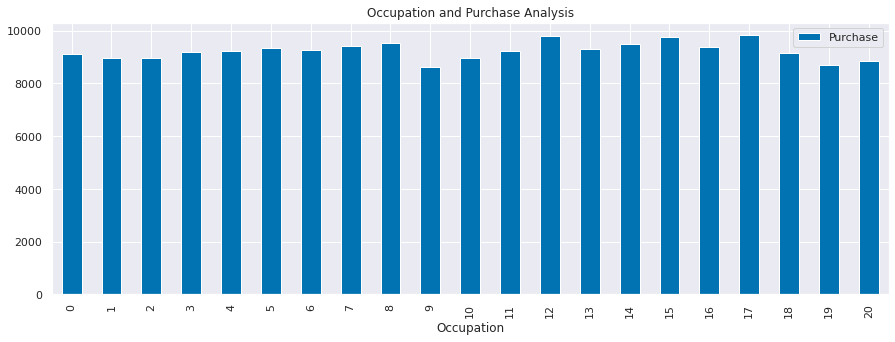

In [ ]:
occup.plot(kind='bar',figsize=(15,5))
plt.title("Occupation and Purchase Analysis")
plt.show()

Although there are some occupations which have higher representations, it seems that the amount each user spends on average is more or less the same for all occupations. Of course, in the end, occupations with the highest representations will have the highest amounts of purchases.

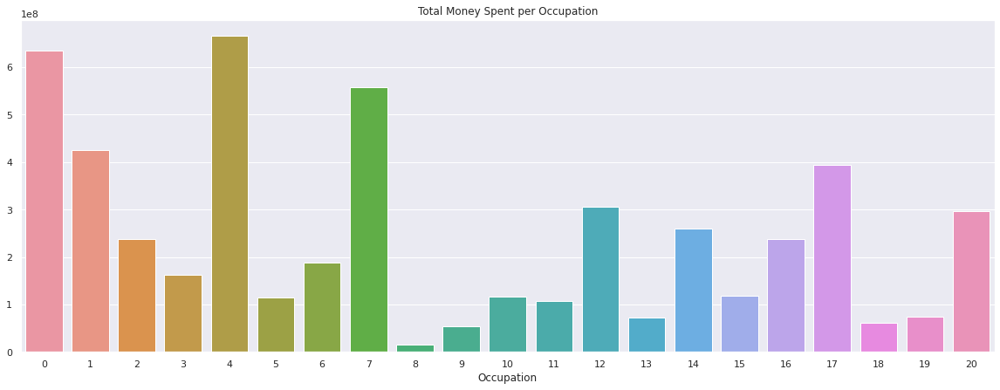

In [ ]:
spent_by_occ = df.groupby(by='Occupation').sum()['Purchase']
plt.figure(figsize=(20, 7))

sns.barplot(x=spent_by_occ.index,y=spent_by_occ.values)
plt.title('Total Money Spent per Occupation')
plt.show()

Once again, the distribution of the mean amount spent within each occupation appears to mirror the distribution of the amount of people within each occupation. This is fortunate from a data science perspective, as we are not working with odd or outstanding features. Our data, in terms of age and occupation seems to simply make sense.

**City_Category**

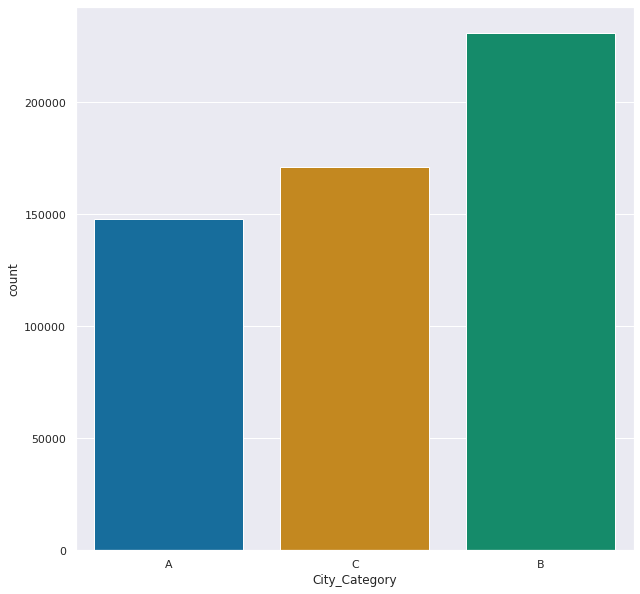

In [ ]:
sns.countplot(df['City_Category'])
plt.show()

It is observed that city category B has made the most number of puchases.



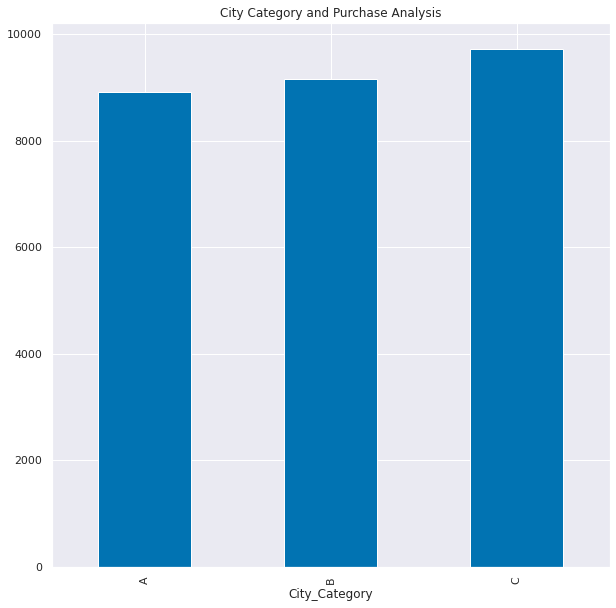

In [ ]:
df.groupby("City_Category").mean()["Purchase"].plot(kind='bar')
plt.title("City Category and Purchase Analysis")
plt.show()

However, the city whose buyers spend the most is city type ‘C’.



**Stay_In_Current_City_Years**

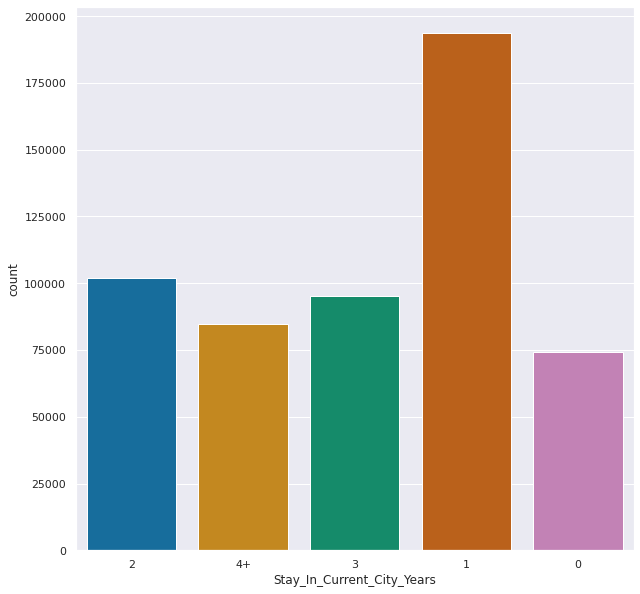

In [ ]:
sns.countplot(df['Stay_In_Current_City_Years'])
plt.show()

It looks like the longest someone is living in that city the less prone they are to buy new things. Hence, if someone is new in town and needs a great number of new things for their house that they’ll take advantage of the low prices in Black Friday to purchase all the things needed.



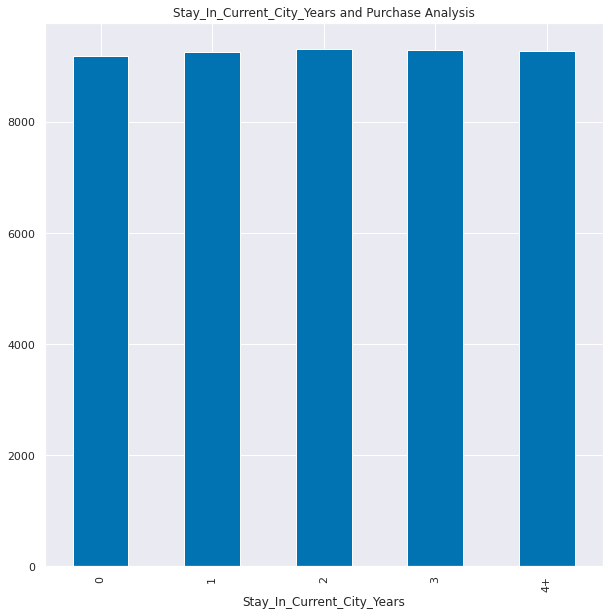

In [ ]:
df.groupby("Stay_In_Current_City_Years").mean()["Purchase"].plot(kind='bar')
plt.title("Stay_In_Current_City_Years and Purchase Analysis")
plt.show()

We see the same pattern seen before which show that on average people tend to spend the same amount on purchases regardeless of their group. People who are new in city are responsible for the higher number of purchase, however looking at it individually they tend to spend the same amount independently of how many years the have lived in their current city.



**Product_Category_1**

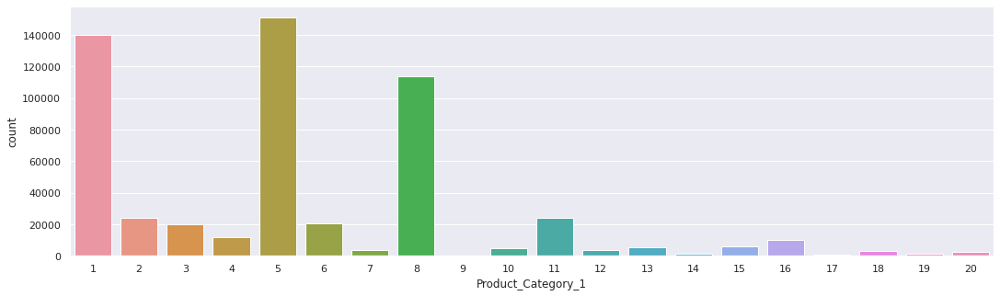

In [ ]:
plt.figure(figsize=(18,5))
sns.countplot(df['Product_Category_1'])
plt.show()

product number 5 is more than other

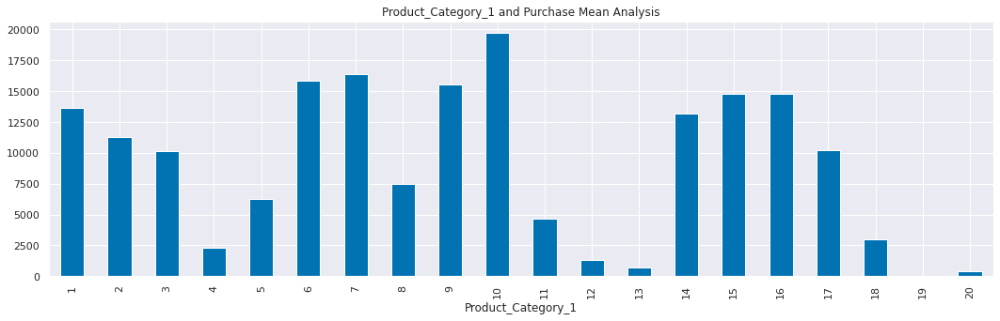

In [ ]:
df.groupby('Product_Category_1').mean()['Purchase'].plot(kind='bar',figsize=(18,5))
plt.title("Product_Category_1 and Purchase Mean Analysis")
plt.show()

If you see the value spent on average for Product_Category_1 you see that although there were more products bought for categories 1,5,8 the average amount spent for those three is not the highest. It is interesting to see other categories appearing with high purchase values despite having low impact on sales number.

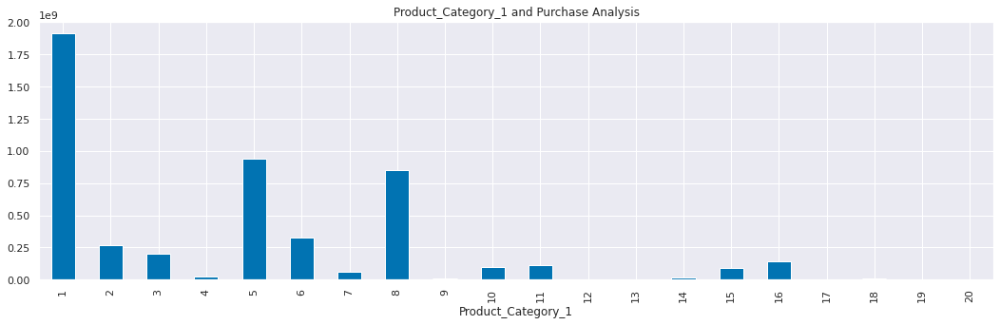

In [ ]:
df.groupby('Product_Category_1').sum()['Purchase'].plot(kind='bar',figsize=(18,5))
plt.title("Product_Category_1 and Purchase Analysis")
plt.show()

The distribution that we saw for this predictor previously appears here. For example, those three products have the highest sum of sales since their were three most sold products.

**Product_Category_2**

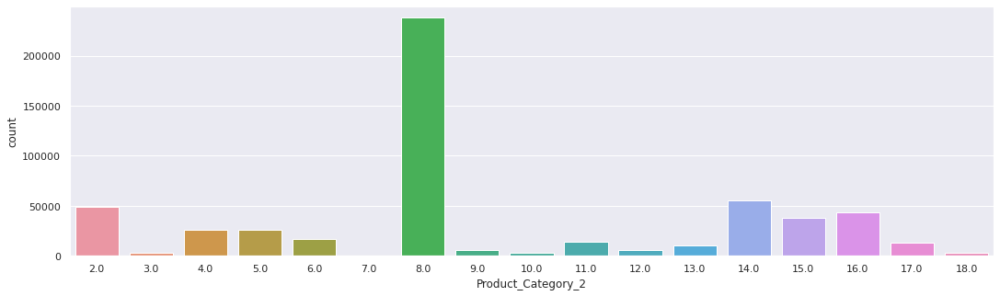

In [ ]:
plt.figure(figsize=(18,5))
sns.countplot(df['Product_Category_2'])
plt.show()

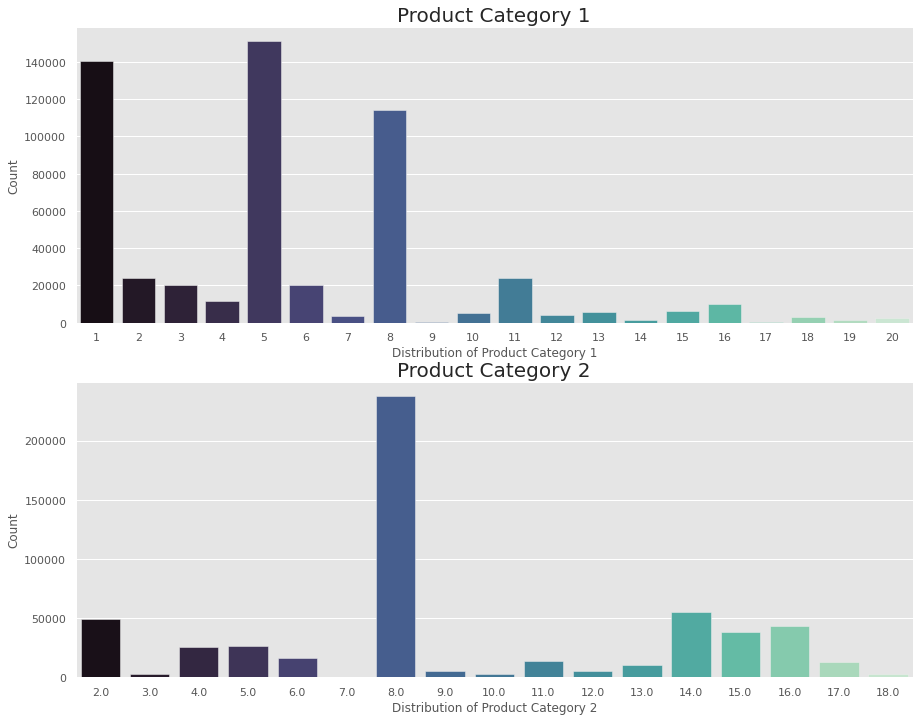

In [ ]:
# visualizing the different product categories

plt.rcParams['figure.figsize'] = (15, 25)
plt.style.use('ggplot')

plt.subplot(4, 1, 1)
sns.countplot(df['Product_Category_1'], palette = 'mako')
plt.title('Product Category 1', fontsize = 20)
plt.xlabel('Distribution of Product Category 1')
plt.ylabel('Count')

plt.subplot(4, 1, 2)
sns.countplot(df['Product_Category_2'], palette = 'mako')

plt.title('Product Category 2', fontsize = 20)
plt.xlabel('Distribution of Product Category 2')
plt.ylabel('Count')


plt.show()

#  corelations & heatmap

In [ ]:
df.corr()


,Occupation,Marital_Status,Product_Category_1,Product_Category_2,Purchase
Occupation,1.000000,0.024280,-0.007618,0.001566,0.020833
Marital_Status,0.024280,1.000000,0.019888,0.010260,-0.000463
Product_Category_1,-0.007618,0.019888,1.000000,0.279247,-0.343703
Product_Category_2,0.001566,0.010260,0.279247,1.000000,-0.128651
Purchase,0.020833,-0.000463,-0.343703,-0.128651,1.000000


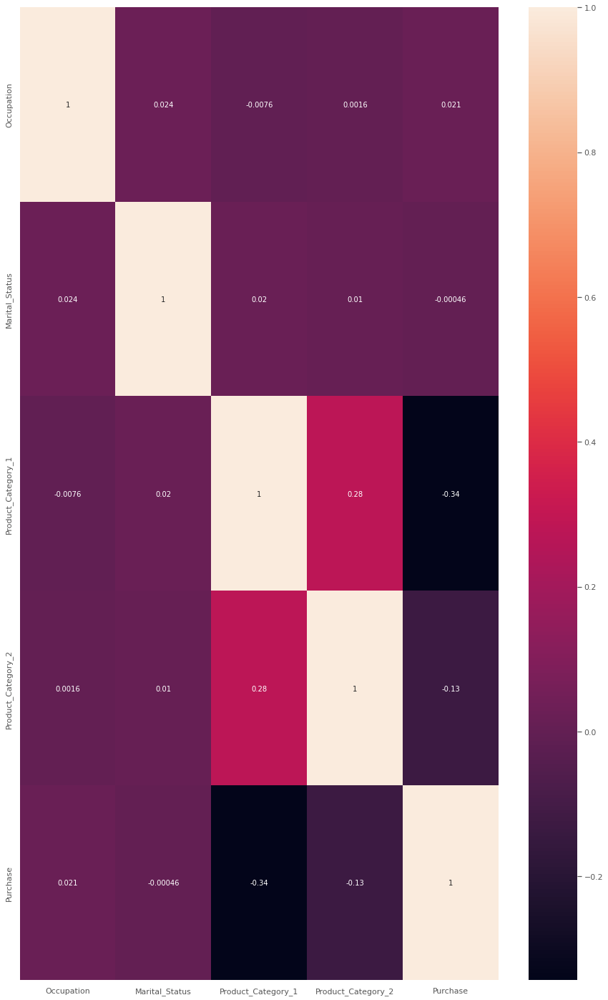

In [ ]:
sns.heatmap(df.corr(),annot=True)
plt.show()

There is a some corellation between the product category groups.



# **Encoding the categorical variables**

In [ ]:
from sklearn.preprocessing import LabelEncoder
lr = LabelEncoder()

In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Gender                      550068 non-null  object 
 1   Age                         550068 non-null  object 
 2   Occupation                  550068 non-null  int64  
 3   City_Category               550068 non-null  object 
 4   Stay_In_Current_City_Years  550068 non-null  object 
 5   Marital_Status              550068 non-null  int64  
 6   Product_Category_1          550068 non-null  int64  
 7   Product_Category_2          550068 non-null  float64
 8   Purchase                    550068 non-null  int64  
dtypes: float64(1), int64(4), object(4)
memory usage: 37.8+ MB


In [ ]:
df['Gender'] = lr.fit_transform(df['Gender'])
df['Age'] = lr.fit_transform(df['Age'])
df['City_Category'] = lr.fit_transform(df['City_Category'])
df['Stay_In_Current_City_Years'] = lr.fit_transform(df['Stay_In_Current_City_Years'])


In [ ]:
#df = pd.get_dummies(df, columns=['Stay_In_Current_City_Years'])


In [ ]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Gender                      550068 non-null  int64  
 1   Age                         550068 non-null  int64  
 2   Occupation                  550068 non-null  int64  
 3   City_Category               550068 non-null  int64  
 4   Stay_In_Current_City_Years  550068 non-null  int64  
 5   Marital_Status              550068 non-null  int64  
 6   Product_Category_1          550068 non-null  int64  
 7   Product_Category_2          550068 non-null  float64
 8   Purchase                    550068 non-null  int64  
dtypes: float64(1), int64(8)
memory usage: 37.8 MB


In [ ]:
df.describe()

,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2,Purchase
count,550068.000000,550068.000000,550068.000000,550068.000000,550068.000000,550068.000000,550068.000000,550068.000000,550068.000000
mean,0.753105,2.496430,8.076707,1.042640,1.858418,0.409653,5.404270,9.260768,9263.968713
std,0.431205,1.353632,6.522660,0.760211,1.289443,0.491770,3.936211,4.294093,5023.065394
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,12.000000
25%,1.000000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,8.000000,5823.000000
50%,1.000000,2.000000,7.000000,1.000000,2.000000,0.000000,5.000000,8.000000,8047.000000
75%,1.000000,3.000000,14.000000,2.000000,3.000000,1.000000,8.000000,14.000000,12054.000000
max,1.000000,6.000000,20.000000,2.000000,4.000000,1.000000,20.000000,18.000000,23961.000000


In [ ]:
df.columns

Index(['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2', 'Purchase'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Gender                      550068 non-null  int64  
 1   Age                         550068 non-null  int64  
 2   Occupation                  550068 non-null  int64  
 3   City_Category               550068 non-null  int64  
 4   Stay_In_Current_City_Years  550068 non-null  int64  
 5   Marital_Status              550068 non-null  int64  
 6   Product_Category_1          550068 non-null  int64  
 7   Product_Category_2          550068 non-null  float64
 8   Purchase                    550068 non-null  int64  
dtypes: float64(1), int64(8)
memory usage: 37.8 MB


In [ ]:
df.shape

(550068, 9)

# **Splitting data**

In [ ]:
x = df.drop("Purchase",axis=1)
y=df['Purchase']


In [ ]:
from sklearn.model_selection import train_test_split


In [ ]:
(x_train,x_test,y_train,y_test) = train_test_split(x,y,test_size=0.25)

In [ ]:
print(x.shape)
print(y.shape)

(550068, 8)
(550068,)


# **Feature Scaling**

In [ ]:
from sklearn.preprocessing import StandardScaler


In [ ]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
len(x.columns)

8

# **Modeling**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


models = {
    'LR': LinearRegression(),
    'DT': DecisionTreeRegressor(),
    'RF': RandomForestRegressor(),
}


for name, model in models.items():
    print(f"Model: {name}")
    print("-"*20)
    model.fit(x_train, y_train)
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)
    print(f"Train MAE: {mean_absolute_error(y_train, y_pred_train)}")
    print(f"Test MAE: {mean_absolute_error(y_test, y_pred_test)}")
    print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train, y_pred_train))}")
    print(f"Test RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_test))}")
    print(f"Train R2: {r2_score(y_train, y_pred_train)}")
    print(f"Test R2: {r2_score(y_test, y_pred_test)}")
    print("\n")

Model: LR
--------------------
Train MAE: 3594.650632726737
Test MAE: 3600.6966475921236
Train RMSE: 4696.505291336021
Test RMSE: 4698.338770845699
Train R2: 0.12507738447652594
Test R2: 0.12725775975129816


Model: DT
--------------------
Train MAE: 1783.4052208723278
Test MAE: 2263.0047778417834
Train RMSE: 2535.581922127162
Test RMSE: 3143.147764764553
Train R2: 0.7449793759821649
Test R2: 0.6094047687391189


Model: RF
--------------------
Train MAE: 1854.6945938624465
Test MAE: 2202.0462769030114
Train RMSE: 2560.371798815118
Test RMSE: 3010.7977192688586
Train R2: 0.7399684284850372
Test R2: 0.6416061928953382




# saving model

In [ ]:
!pip install flask

In [ ]:
model =RandomForestRegressor()
model.fit(x_train,y_train)

RandomForestRegressor()

In [ ]:
x.columns

Index(['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2'],
      dtype='object')

In [ ]:
model

RandomForestRegressor()

In [ ]:
import joblib

In [ ]:
joblib.dump(model,"model.h5")


['model.h5']

In [ ]:
joblib.dump(scaler,'scaler.h5')

['scaler.h5']

# Test model by my data


In [ ]:
x.iloc[[60]]

,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category_1,Product_Category_2
60,1,2,7,0,1,0,5,8.0


In [ ]:
x.columns


Index(['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category_1',
       'Product_Category_2'],
      dtype='object')

In [ ]:
my_df=[1,2,7,0,1,0,5,8.0]
my_f_scaled=scaler.transform([my_df])

In [ ]:
model.predict(my_f_scaled)

array([6059.81997361])